#  Native-space Identification of Target Regions with T1w images (3T)

In [ ]:
# TMS preprocessing
# Purpose:
# - generate anatomically defined masks from standardized atlasses
# - identify cordinates of target regions in native space
# Steps:
# 0. prepare masks
# 1. inverse registration of MNI space to native space 
# 2. get cordinates and save
# Inputs:
# -T1 in 3T 
# -Any brain regions (e.g., aMCC) probability map 
# Last update/notes:
# - T1 images from frmiprep (collected at Brown) are LPI format
# ====================================================================================================================
%reset -f

# Load modules/packages
from basic_python import * # now added to startup folder
from mri_python import * 
globals().update(configure_mri_env())

# Basic
import cv2 
import scipy.io
from scipy.spatial.distance import cdist
from scipy.ndimage import binary_fill_holes, binary_closing, label
from scipy.ndimage import center_of_mass, gaussian_filter

# Nipype
import nibabel as nib
from nipype.interfaces.spm import NewSegment
from nipype.interfaces.matlab import MatlabCommand
from nibabel.orientations import io_orientation, axcodes2ornt, ornt_transform, apply_orientation, aff2axcodes

# Nilearn
from nilearn import datasets, image, masking, plotting
from nilearn.image import math_img, resample_to_img, new_img_like

# Ants
# https://github.com/ANTsX/ANTs?tab=readme-ov-file
# https://github.com/antsx/antspy
import ants

# Skin
import trimesh
from trimesh.proximity import ProximityQuery
from skimage.transform import resize

# Atlases
from templateflow.api import get
t1_mni_path = get('MNI152NLin2009cAsym', resolution=1, suffix='T1w', extension='nii.gz')
t1_mni = ants.image_read(str([p for p in t1_mni_path if 'desc-brain' not in str(p)][0]))
t1_mni_brain = ants.image_read(str([p for p in t1_mni_path if 'desc-brain' in str(p)][0]))
os.environ["NILEARN_DATA"] = "/Users/atsushikikumoto/Dropbox/w_ONGOINGANY/atlases"

# Define paths 
DIR_HERE = Path(os.path.dirname(os.path.realpath("__file__")))
DIR_DATA = Path.home() / "Brown Dropbox" / "Atsushi Kikumoto" / "AtsushiK_Brown" / "EEGTMS_RuleAction" / "TMSTargeting" 
DIR_MASK_TMP = DIR_HERE / 'z_masks_templates'
DIR_MASK_OUT = DIR_HERE / 'z_masks_outputs'

# Files
DIR_T1ZIPPED = [p for p in DIR_DATA.rglob("sub-*_T1w.nii.gz") if p.is_file()]
DIR_T1FILES = [p for p in DIR_DATA.rglob("sub-*_T1w.nii") if p.is_file()]
DIR_CFILES = [p for p in DIR_DATA.rglob("*_con_0001.nii") if p.is_file()] # contrasts
DIR_WARPFILES = [p for p in DIR_DATA.rglob("*_from-MNI152NLin2009cAsym_to-T1w_mode-image_xfm.h5") if p.is_file()]
DIR_T1BMASK = [p for p in DIR_DATA.rglob("sub-*-brain_mask.nii.gz") if p.is_file()]
DIR_T1GM = [p for p in DIR_DATA.rglob("sub-*_label-GM_probseg.nii.gz") if p.is_file()]

# Files (unnecessary)
DIR_T1C1FILES = list(DIR_DATA.rglob('c1*.nii'))
DIR_T1C2FILES = list(DIR_DATA.rglob('c2*.nii'))
DIR_T1C3FILES = list(DIR_DATA.rglob('c3*.nii'))
DIR_T1C4FILES = list(DIR_DATA.rglob('c4*.nii'))
DIR_T1C5FILES = list(DIR_DATA.rglob('c5*.nii'))
DIR_T1C6FILES = list(DIR_DATA.rglob('c6*.nii'))
DIR_SKINFILES = list(DIR_DATA.rglob('sub-*Skin.stl'))
SUBJECT_ID = [f.stem.split("_")[0] for f in DIR_T1FILES]


# Functions
def detect_cluster(m_bool: np.ndarray) -> np.ndarray:
    """Keep largest connected component (optional)."""
    if not m_bool.any():
        return m_bool
    lab, n = label(m_bool.astype(np.uint8))
    if n <= 1:
        return m_bool
    sizes = np.bincount(lab.ravel()); sizes[0] = 0
    return (lab == sizes.argmax())


def threshold_epi(mask_bool, func_data, tail="pos", q=0.80, min_vox=20):
    """Keep top-quantile functional voxels *inside* mask; fallback if too tiny."""
    if not mask_bool.any():
        return mask_bool
    if   tail == "pos": score = np.maximum(func_data, 0)
    elif tail == "neg": score = np.maximum(-func_data, 0)
    else:               score = np.abs(func_data)

    vals = score[mask_bool]
    thr  = np.quantile(vals[vals > 0], q) if (vals > 0).any() else 0
    sel  = mask_bool & (score >= thr)
    return sel if sel.sum() >= min_vox else mask_bool

def wcom_from_sel(ii, jj, kk, sel, affine, weight_vol=None):
    """Weighted COM from selected indices"""
    if not np.any(sel):
        return None
    ijk = np.column_stack((ii[sel], jj[sel], kk[sel]))
    if weight_vol is not None:
        w = weight_vol[ii[sel], jj[sel], kk[sel]]
        if not np.any(w > 0):
            w = np.ones(ijk.shape[0], dtype=float)
    else:
        w = np.ones(ijk.shape[0], dtype=float)
    com_ijk = np.average(ijk, axis=0, weights=w)
    return nib.affines.apply_affine(affine, com_ijk)  # world (mm)

%whos

Variable                       Type         Data/Info
-----------------------------------------------------
Counter                        type         <class 'collections.Counter'>
DIR_CFILES                     list         n=6
DIR_DATA                       PosixPath    /Users/atsushikikumoto/Br<...>S_RuleAction/TMSTargeting
DIR_HERE                       PosixPath    /Users/atsushikikumoto/Br<...>S_RuleAction/TMSTargeting
DIR_MAIN                       PosixPath    /Users/atsushikikumoto/Dr<...>pbox (Personal)/w_SCRIPTS
DIR_MASK_OUT                   PosixPath    /Users/atsushikikumoto/Br<...>Targeting/z_masks_outputs
DIR_MASK_TMP                   PosixPath    /Users/atsushikikumoto/Br<...>rgeting/z_masks_templates
DIR_SKINFILES                  list         n=0
DIR_SPM                        PosixPath    /Users/atsushikikumoto/Dr<...>NGMFILES64/w_OTHERS/spm12
DIR_T1BMASK                    list         n=7
DIR_T1C1FILES                  list         n=8
DIR_T1C2FILES             

In [13]:
# Load raw native images (before any reorient or registration)
t1_raw = ants.image_read(str(DIR_T1FILES[1]))

print("T1 native")
print("  Orientation:", ants.get_orientation(t1_raw))
print("  Shape:", t1_raw.shape)
print("  Spacing:", t1_raw.spacing)
print("  Origin:", t1_raw.origin)
print("  Direction:\n", t1_raw.direction)


t1_raw = ants.image_read(str(DIR_T1FILES[5]))

print("T1 native")
print("  Orientation:", ants.get_orientation(t1_raw))
print("  Shape:", t1_raw.shape)
print("  Spacing:", t1_raw.spacing)
print("  Origin:", t1_raw.origin)
print("  Direction:\n", t1_raw.direction)

# from nibabel.orientations import aff2axcodes
# this method?

T1 native
  Orientation: LPI
  Shape: (176, 256, 256)
  Spacing: (1.0, 1.0, 1.0)
  Origin: (68.3172836303711, 130.6678924560547, -150.08692932128906)
  Direction:
 [[-0.994401    0.09315882  0.04988072]
 [-0.09510489 -0.99473512 -0.03817199]
 [ 0.04606205 -0.04270217  0.99802546]]
T1 native
  Orientation: LPI
  Shape: (176, 256, 256)
  Spacing: (1.0, 1.0, 1.0)
  Origin: (81.70802307128906, 122.15499877929688, -140.70208740234375)
  Direction:
 [[-0.99977993  0.02059314 -0.0040015 ]
 [-0.02053057 -0.99967527 -0.01509461]
 [-0.00431105 -0.01500913  0.99987806]]


In [ ]:
# Load raw native images (before any reorient or registration)
c_raw = ants.image_read(str(DIR_CFILES[0]))

print("Contrast")
print("  Orientation:", ants.get_orientation(c_raw))
print("  Shape:", c_raw.shape)
print("  Spacing:", c_raw.spacing)
print("  Origin:", c_raw.origin)
print("  Direction:\n", c_raw.direction)


Contrast
  Orientation: LPI
  Shape: (97, 115, 97)
  Spacing: (2.0, 2.0, 2.0)
  Origin: (96.5, 132.5, -78.5)
  Direction:
 [[-1.  0.  0.]
 [ 0. -1.  0.]
 [ 0.  0.  1.]]


In [ ]:
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# ~~~~~~~~~~~~~~~~ GENERATING MASKS ~~~~~~~~~~~~~~~~~~
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [ ]:
?datasets.fetch_atlas_schaefer_2018

Signature:
datasets.fetch_atlas_schaefer_2018(
    n_rois=400,
    yeo_networks=7,
    resolution_mm=1,
    data_dir=None,
    base_url=None,
    resume=True,
    verbose=1,
)
Docstring:
Download and return file names for the Schaefer 2018 parcellation.

.. versionadded:: 0.5.1

This function returns a :term:`Deterministic atlas`, and the provided
images are in MNI152 space.

For more information on this dataset, see :footcite:t:`schaefer_atlas`,
:footcite:t:`Schaefer2017`,
and :footcite:t:`Yeo2011`.

Parameters
----------
n_rois : {100, 200, 300, 400, 500, 600, 700, 800, 900, 1000}, default=400
    Number of regions of interest.

yeo_networks : {7, 17}, default=7
    ROI annotation according to yeo networks.

resolution_mm : {1, 2}, default=1mm
    Spatial resolution of atlas image in mm.

data_dir : :obj:`pathlib.Path` or :obj:`str` or None, optional
    Path where data should be downloaded.
    By default, files are downloaded in a ``nilearn_data`` folder
    in the home directory o

/var/folders/st/vdmcwrln1mb0m0p2cbhwfhvc0000gn/T/ipykernel_1213/479756317.py:5: FutureWarning:

'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.

/var/folders/st/vdmcwrln1mb0m0p2cbhwfhvc0000gn/T/ipykernel_1213/479756317.py:5: FutureWarning:

From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.

/Users/atsushikikumoto/opt/anaconda3/envs/mri/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning:


/var/folders/st/vdmcwrln1mb0m0p2cbhwfhvc0000gn/T/ipykernel_1213/479756317.py:7: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.




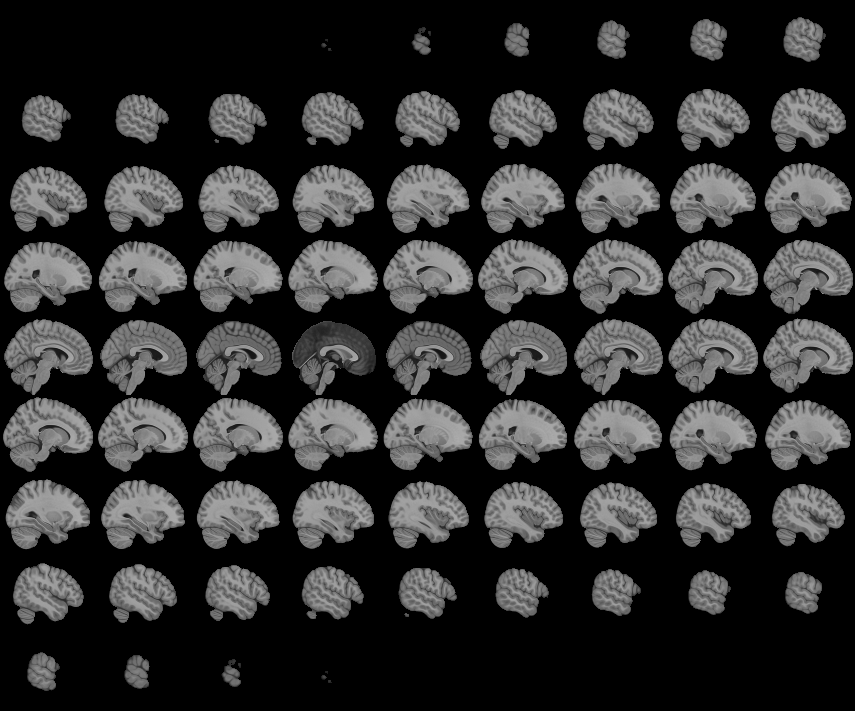
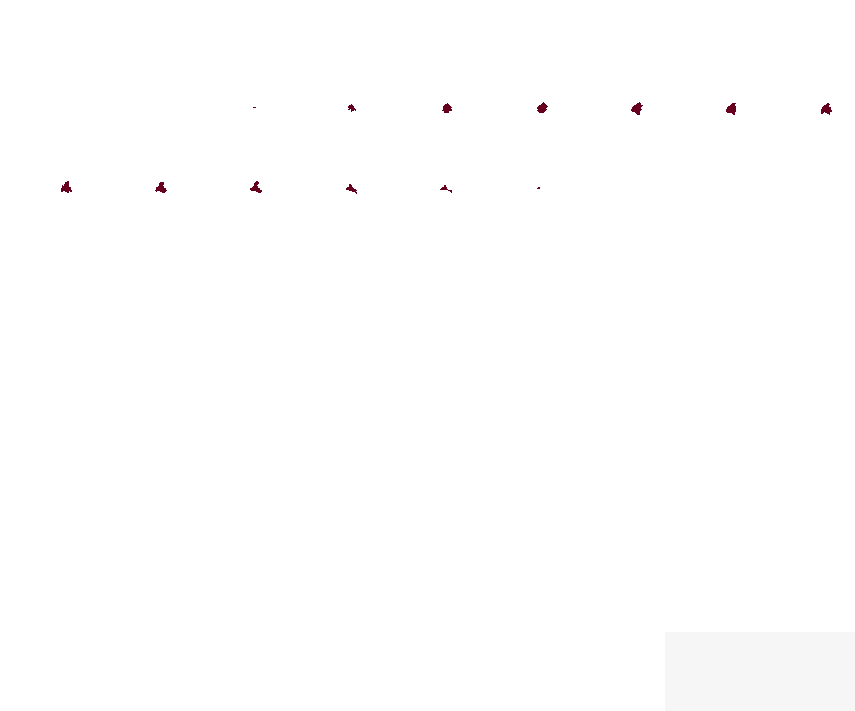

In [ ]:

mask_img = image.load_img(DIR_MASK_TMP / "Schaefer2018_400-17_131_left_lPFC4_roi.nii")
mni = datasets.load_mni152_template(resolution=1)        
mni = image.resample_to_img(mni, mask_img, interpolation="linear")  

plotting.view_img(mask_img, bg_img=mni, opacity=0.6, radiological=False)

[fetch_atlas_schaefer_2018] Dataset found in /Users/atsushikikumoto/nilearn_data/schaefer_2018

0: Background
1: 7Networks_LH_Vis_1
2: 7Networks_LH_Vis_2
3: 7Networks_LH_Vis_3
4: 7Networks_LH_Vis_4
5: 7Networks_LH_Vis_5
6: 7Networks_LH_Vis_6
7: 7Networks_LH_Vis_7
8: 7Networks_LH_Vis_8
9: 7Networks_LH_Vis_9
10: 7Networks_LH_Vis_10
11: 7Networks_LH_Vis_11
12: 7Networks_LH_Vis_12
13: 7Networks_LH_Vis_13
14: 7Networks_LH_Vis_14
15: 7Networks_LH_Vis_15
16: 7Networks_LH_Vis_16
17: 7Networks_LH_Vis_17
18: 7Networks_LH_Vis_18
19: 7Networks_LH_Vis_19
20: 7Networks_LH_Vis_20
21: 7Networks_LH_Vis_21
22: 7Networks_LH_Vis_22
23: 7Networks_LH_Vis_23
24: 7Networks_LH_Vis_24
25: 7Networks_LH_Vis_25
26: 7Networks_LH_Vis_26
27: 7Networks_LH_Vis_27
28: 7Networks_LH_Vis_28
29: 7Networks_LH_Vis_29
30: 7Networks_LH_Vis_30
31: 7Networks_LH_Vis_31
32: 7Networks_LH_SomMot_1
33: 7Networks_LH_SomMot_2
34: 7Networks_LH_SomMot_3
35: 7Networks_LH_SomMot_4
36: 7Networks_LH_SomMot_5
37: 7Networks_LH_SomMot_6
38: 7Networks_LH_SomMot_7
39: 7Networks_LH_SomMot_8
40: 7Networks_LH_SomMot_9
41: 7Networks_LH_SomMot_10

/var/folders/st/vdmcwrln1mb0m0p2cbhwfhvc0000gn/T/ipykernel_1213/1990474633.py:38: FutureWarning:

'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.

/var/folders/st/vdmcwrln1mb0m0p2cbhwfhvc0000gn/T/ipykernel_1213/1990474633.py:38: FutureWarning:

From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.

/Users/atsushikikumoto/opt/anaconda3/envs/mri/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning:


/var/folders/st/vdmcwrln1mb0m0p2cbhwfhvc0000gn/T/ipykernel_1213/1990474633.py:39: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/var/folders/st/vdmcwrln1mb0m0p2cbhwfhvc0000gn/T/ipykern


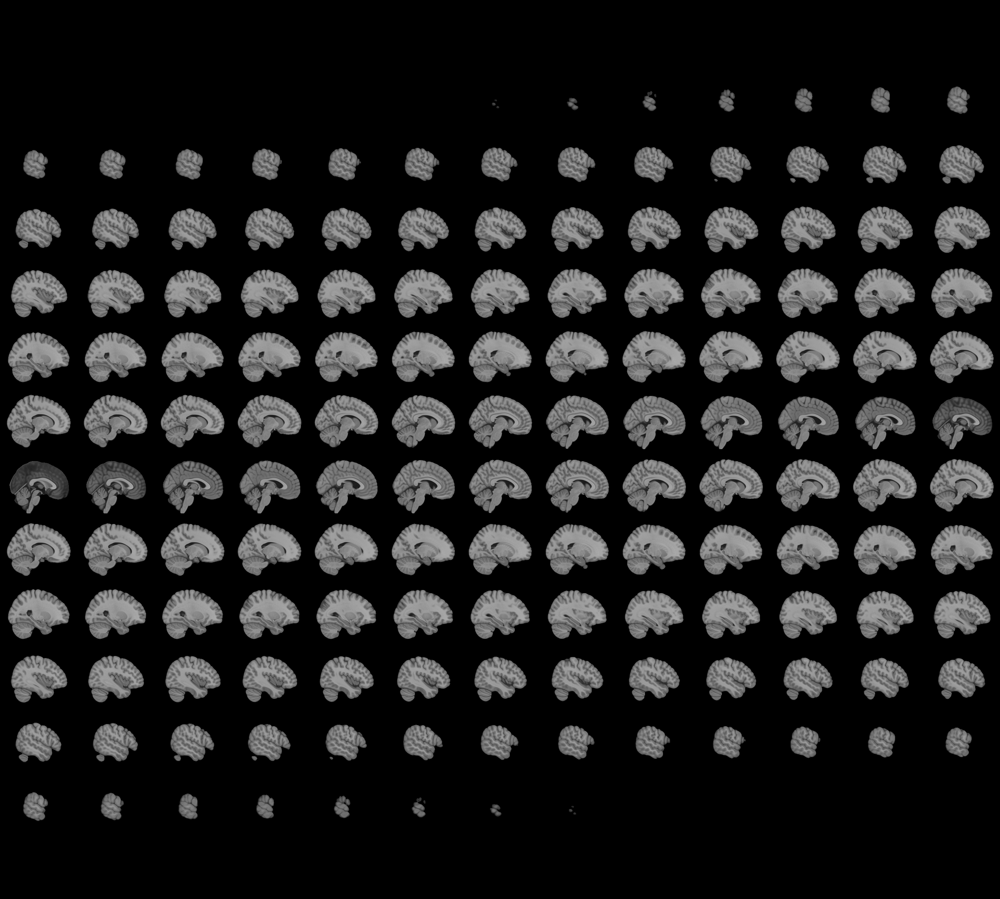
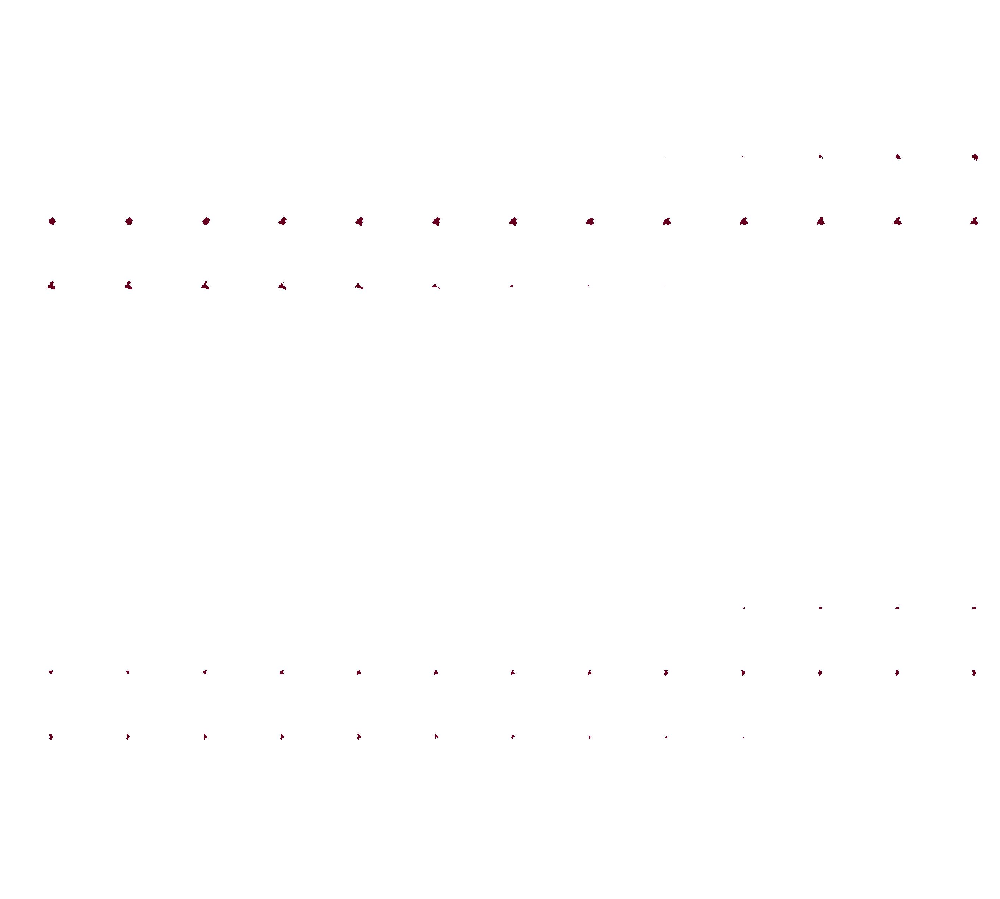

In [ ]:
# =========================================
# Schaefer atlas masks 
# - DLPFC: dorsolateral prefrontal cortex
# =========================================

# Pick your variant
# n_rois = 100, 200, 300, or 400
# yeo_networks = 7 or 17
# resolution_mm = 1 or 2
schaefer = datasets.fetch_atlas_schaefer_2018(n_rois=400,yeo_networks=7,resolution_mm=1)
atlas_img = image.load_img(schaefer.maps)
atlas_affine = atlas_img.affine
atlas_data = atlas_img.get_fdata()  # (X,Y,Z,N) in %
labels = schaefer.labels
base = 1 if labels and str(labels[0]).lower().startswith("background") else 0
for i, label in enumerate(labels):print(f"{i}: {label}")

# # Settings: target regions from atlas
regions_to_index = {
    "DLPFC":    [140, 347] # 7Networks_LH_Cont_PFCl_6/7Networks_RH_Cont_PFCl_7
}

for region, idxs in regions_to_index.items():
    print(idxs, region)

    # Access to data, note Schaefer file is a 3D label map
    atlas_labels = atlas_data.astype(np.int32)
    mask_arr = np.isin(atlas_labels, regions_to_index[region]).astype(np.uint8)
    mask_img = nib.Nifti1Image(mask_arr, atlas_img.affine)
    mask_img.header.set_data_dtype(np.uint8)

    # # Export
    out_path = DIR_MASK_OUT / f"{region}_Schaefer_mask_MNI.nii.gz"
    nib.save(mask_img, str(out_path))

# # Quick check   
mni = datasets.load_mni152_template(resolution=1)        
mni = image.resample_to_img(mni, mask_img, interpolation="linear")  
plotting.view_img(mask_img, bg_img=mni, opacity=0.6, radiological=False)

In [ ]:
# =========================================
# Juelich atlas masks 
# Targets: IPS (hIP1/2/3 union), prePMD (BA6), V1 (BA17)
# Saves: {target}_Juelich_*_prob_mask_MNI.nii.gz
# - IPS: intraparietal sulcus (hIP1/2/3 union)
# - prePMD: (Picard & Strick, 20) -> not very aligned to prePMD 
# - V1: Primary visual cortex (BA17+BA18, phosphene-favored clip)
# =========================================

# Load Juelich probabilistic atlas (4D), labels as in your list
juelich = datasets.fetch_atlas_juelich('prob-1mm')
atlas_img = image.load_img(juelich.maps)
atlas_affine = atlas_img.affine
atlas_data = atlas_img.get_fdata()  # (X,Y,Z,N) in %
labels = juelich.labels
base = 1 if labels and str(labels[0]).lower().startswith("background") else 0
for i, label in enumerate(labels):print(f"{i}: {label}")

# Settings: target regions from atlas
threshold = .3
regions_to_index = {
    "IPS":    [4, 5, 6],   # hIP1, hIP2, hIP3
    #"prePMD": [27],        # Premotor cortex BA6
    "V1":     [48, 49],      # ★ V1(BA17) + V2(BA18) を統合
}

# Settings: region-specific clipping (MNI mm)
region_clip_bounds = {
    # V1: phosphene-favored: midline & posterior & dorsal (tune as needed)
    "IPS":    {"X": (-np.inf, np.inf), "Y": (-np.inf, np.inf), "Z": (-np.inf, np.inf)},  
    "prePMD": {"X": (-30, -40), "Y": (10, 15), "Z": (25, 40)},  # Nee & Badre
    "V1":     {"X": (0, 20), "Y": (-110.0, -60.0), "Z": (-10.0, 30.0)},
}

# Precompute MNI mm coordinates on atlas grid ---
shape = atlas_img.shape[:3]
ii, jj, kk = np.meshgrid(np.arange(shape[0]), np.arange(shape[1]), np.arange(shape[2]), indexing='ij')
ijk = np.column_stack((ii.ravel(), jj.ravel(), kk.ravel()))
xyz = nib.affines.apply_affine(atlas_affine, ijk).reshape(*shape, 3)
Xmm, Ymm, Zmm = xyz[..., 0], xyz[..., 1], xyz[..., 2]

# ---------------------------------
# Loop over the three target regions
# ---------------------------------
for region, idxs in regions_to_index.items():
    print(idxs, region)
    
    # Generate union masks and threshold if necessary
    vol_idx = [i - base for i in idxs]
    assert all(0 <= v < atlas_data.shape[3] for v in vol_idx), f"Index out of range: {vol_idx}"
    union_prob = np.max(atlas_data[..., vol_idx] / 100.0, axis=3).astype(np.float32)

    # Threshold for atlas selection -> binary
    prob = (union_prob >= threshold).astype(np.uint8)

    # Region-specific clip (if defined)
    clip = region_clip_bounds[region]
    (x_lo, x_hi) = clip["X"]  
    (y_lo, y_hi) = clip["Y"]
    (z_lo, z_hi) = clip["Z"]

    x_ok = (np.abs(Xmm) >= x_lo) & (np.abs(Xmm) <= x_hi)
    y_ok = (Ymm >= y_lo) & (Ymm <= y_hi)
    z_ok = (Zmm >= z_lo) & (Zmm <= z_hi)
    clip_mask = x_ok & y_ok & z_ok

    # Apply clip
    prob = (prob.astype(bool) & clip_mask).astype(np.uint8)

    # Re-orient to RAS
    #mask = nifti_to_ants(nib.Nifti1Image(prob.astype(np.uint8), atlas_affine))
    #mask_ras = ants.reorient_image2(mask, orientation='RAS')

    # Save directly in RAS with NiBabel (no ANTs conversion!)
    hdr = atlas_img.header.copy()
    hdr.set_data_dtype(prob.dtype)
    mask_ras = nib.Nifti1Image(prob, atlas_affine, hdr)
    mask_ras.set_sform(atlas_affine, code=1)
    mask_ras.set_qform(atlas_affine, code=1)

    # Export
    out_path = DIR_MASK_OUT / f"{region}_Juelich_mask_MNI.nii.gz"
    nib.save(mask_ras, str(out_path))
    print_img_info(mask_ras)

    # Maximum voxels
    masked_prob = union_prob * prob  
    ijk_max = np.unravel_index(np.argmax(masked_prob), masked_prob.shape)
    xyz_max = nib.affines.apply_affine(atlas_affine, np.array([[ijk_max[0], ijk_max[1], ijk_max[2]]], dtype=float))[0]

    # Center of mass of binary masks
    vox_idx = np.column_stack(np.nonzero(prob))
    xyz_all = nib.affines.apply_affine(atlas_affine, vox_idx) if vox_idx.size else np.array([[np.nan]*3])
    com_mm = xyz_all.mean(axis=0)

    print(f"[{region}] target_mm (max-prob) = {np.round(xyz_max,1)} ; "
        f"COM = {np.round(com_mm,1)} ; voxels={vox_idx.shape[0]}")


print("done")

[fetch_atlas_juelich] Dataset found in /Users/atsushikikumoto/nilearn_data/fsl

[4, 5, 6] IPS
  shape    = (182, 218, 182)
  affine   =
[[   1.    0.    0.  -91.]
 [   0.    1.    0. -126.]
 [   0.    0.    1.  -72.]
 [   0.    0.    0.    1.]]
  spacing  = [1. 1. 1.]
  origin   = [ -91. -126.  -72.]
  direction= ~from affine
[IPS] target_mm (max-prob) = [-49. -40.  43.] ; COM = [ -7.  -47.2  43.7] ; voxels=14535
[27] prePMD
  shape    = (182, 218, 182)
  affine   =
[[   1.    0.    0.  -91.]
 [   0.    1.    0. -126.]
 [   0.    0.    1.  -72.]
 [   0.    0.    0.    1.]]
  spacing  = [1. 1. 1.]
  origin   = [ -91. -126.  -72.]
  direction= ~from affine
[prePMD] target_mm (max-prob) = [ -91. -126.  -72.] ; COM = [nan nan nan] ; voxels=0
[48, 49] V1
  shape    = (182, 218, 182)
  affine   =
[[   1.    0.    0.  -91.]
 [   0.    1.    0. -126.]
 [   0.    0.    1.  -72.]
 [   0.    0.    0.    1.]]
  spacing  = [1. 1. 1.]
  origin   = [ -91. -126.  -72.]
  direction= ~from affine
[V1] target_mm (max-prob) = [-14. -62.   3.] ; COM = [  1.1 -84.3   7. ] ; voxels=4716

In [ ]:
# =========================================
# Coordinate based mask: small sphere at XYZ
# Saves: Vertex_MNI_sphere{radius}mm_mask_MNI.nii.gz (RAS)
# - Vertex: definition based on expected Cz chan location
# - prePMD: Badre & D’Esposito
# =========================================

# Settings
region = 'Vertex'
cord_center_mni = (0.0, -10.0, 74.0)   # midline-superior (MNI, mm)
radius_mm = 12.0                           # e.g., 12 mm sphere from smoothing of functional data

# Settings: region-specific XYZ
regions_coords = {
    "Vertex":  (0.0, -10.0, 74.0),
    "prePMD":  [(-38.0, 10.0, 34.0), (38.0, 10.0, 34.0)],  # bilateral
}

# Reference grid (using Juelich atlas geometry)
juelich = datasets.fetch_atlas_juelich('prob-1mm')
atlas_img = image.load_img(juelich.maps)  # 4D (X,Y,Z,N)
atlas_affine = atlas_img.affine
ref_affine  = atlas_affine
ref_shape   = atlas_img.shape[:3]         # (X,Y,Z)

# Build sphere in MNI mm space on the Juelich grid 
ii, jj, kk = np.meshgrid(
    np.arange(ref_shape[0]),
    np.arange(ref_shape[1]),
    np.arange(ref_shape[2]),
    indexing='ij'
)
ijk = np.column_stack((ii.ravel(), jj.ravel(), kk.ravel()))
xyz = nib.affines.apply_affine(ref_affine, ijk)  # (N, 3) in mm

# Build mask: union of spheres for all centers of the selected region
centers = regions_coords[region]
if isinstance(centers, tuple):centers = [centers]  # normalize to list

mask = np.zeros(ref_shape, dtype=np.uint8)
for c in centers:
    c = np.asarray(c, dtype=np.float32)
    dist2 = np.sum((xyz - c)**2, axis=1)
    sph   = (dist2 <= (radius_mm**2)).astype(np.uint8).reshape(ref_shape)
    mask  = np.maximum(mask, sph)  # OR-combine

# Clip to fall inside of brain (in MNI space)
atlas_data = np.asarray(atlas_img.dataobj)        # (X,Y,Z,N)
brain_mni  = (atlas_data.max(axis=3) > 0).astype(np.uint8)
mask = (mask.astype(bool) & brain_mni.astype(bool)).astype(np.uint8)

mask_bool = mask.astype(bool)
mask_bool = binary_fill_holes(mask_bool)
mask_bool = binary_closing(mask_bool, iterations=1)  # 1回だけでOK


# Save directly in RAS with NiBabel (no ANTs conversion)
hdr = atlas_img.header.copy()
hdr.set_data_dtype(np.uint8)
mask_ras = nib.Nifti1Image(mask, ref_affine, hdr)
mask_ras.set_sform(ref_affine, code=1)
mask_ras.set_qform(ref_affine, code=1)

# Export
out_path = DIR_MASK_OUT / f"{region}_CSphere_mask_MNI.nii.gz"
nib.save(mask_ras, str(out_path))


[fetch_atlas_juelich] Dataset found in /Users/atsushikikumoto/nilearn_data/fsl

In [ ]:
# =========================================
# Checking (file format)
# =========================================
from nibabel.orientations import aff2axcodes

for region in ["IPS","prePMD","V1"]:
    p = DIR_MASK_OUT / f"{region}_Juelich_prob_mask_MNI.nii.gz"
    img = image.load_img(str(p))
    print(region, "orient:", aff2axcodes(img.affine), "shape:", img.shape,
          "values:", np.unique(img.get_fdata()).astype(int))
    # expected: orient=('R','A','S'), values=[0 1]

IPS orient: ('R', 'A', 'S') shape: (182, 218, 182) values: [0 1]
prePMD orient: ('R', 'A', 'S') shape: (182, 218, 182) values: [0]
V1 orient: ('R', 'A', 'S') shape: (182, 218, 182) values: [0 1]


/var/folders/st/vdmcwrln1mb0m0p2cbhwfhvc0000gn/T/ipykernel_1213/3754843800.py:16: FutureWarning:

'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.

/var/folders/st/vdmcwrln1mb0m0p2cbhwfhvc0000gn/T/ipykernel_1213/3754843800.py:16: FutureWarning:

From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.

/Users/atsushikikumoto/opt/anaconda3/envs/mri/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning:


/var/folders/st/vdmcwrln1mb0m0p2cbhwfhvc0000gn/T/ipykernel_1213/3754843800.py:18: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.




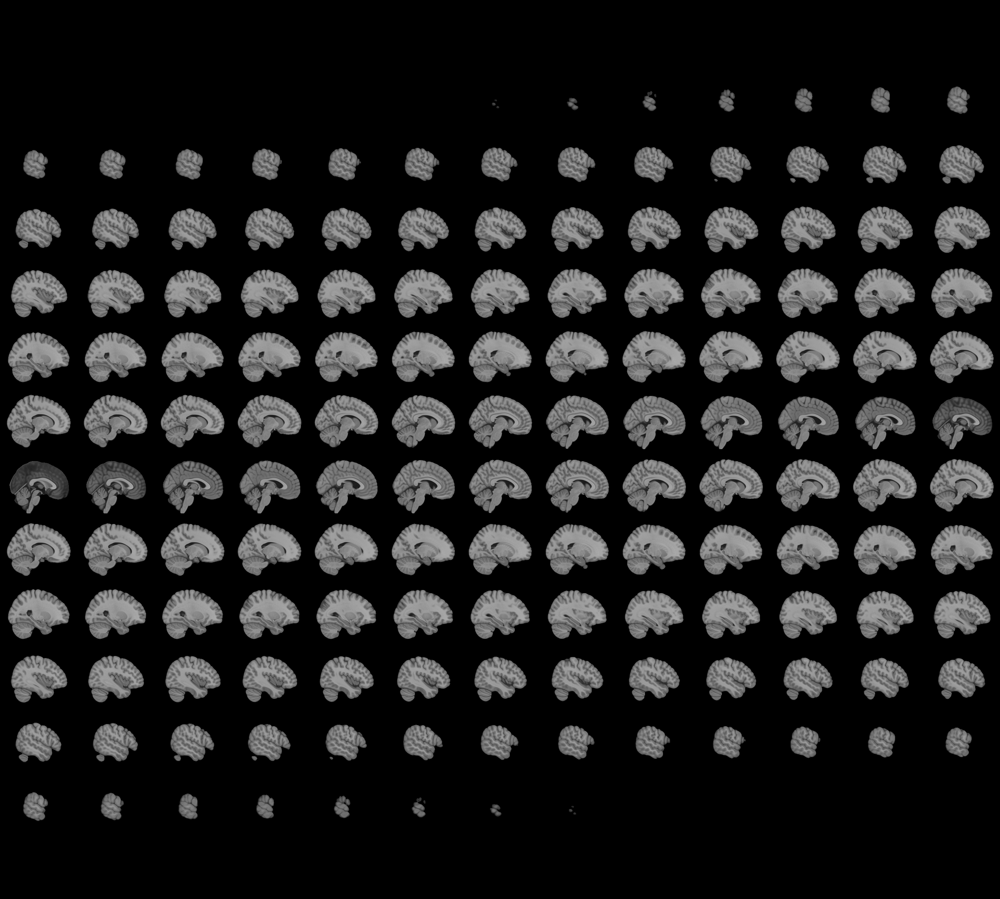
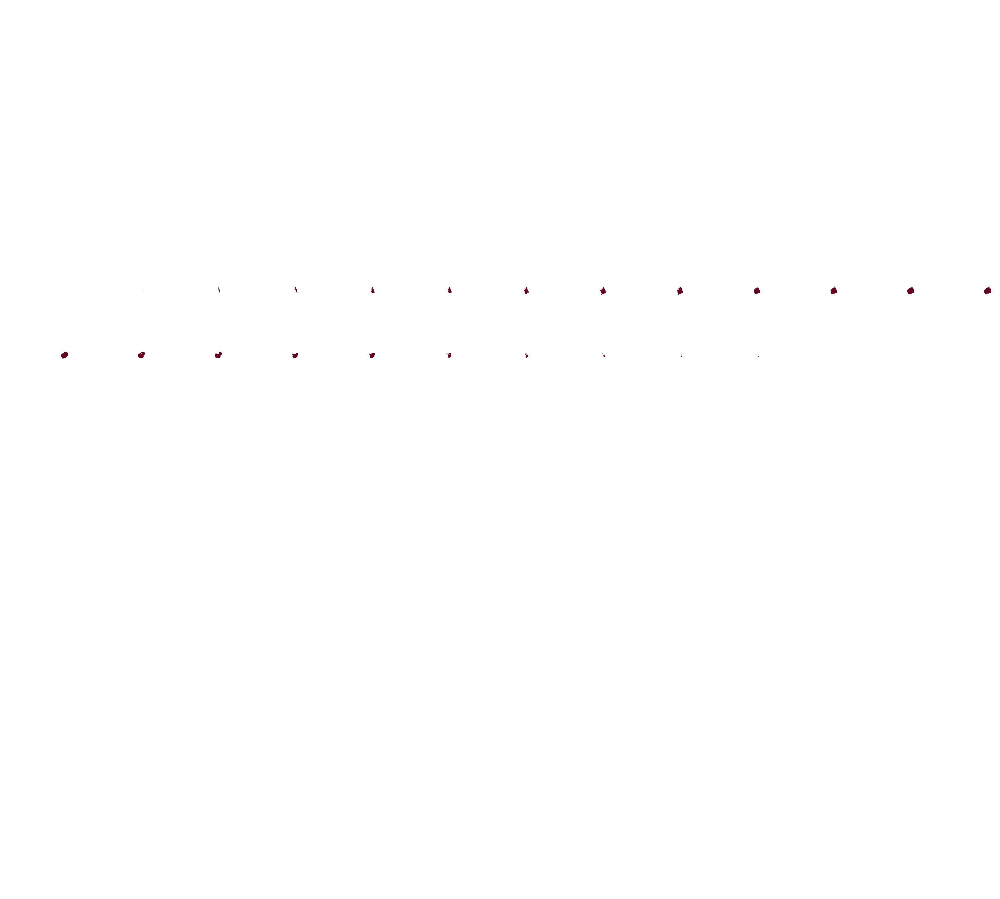

In [ ]:
# =========================================
# Checking (visualize)
# =========================================
# # Atlas-based
region = "DLPFC"  # ← "IPS"/ "V1"
# f = (DIR_MASK_OUT if 'DIR_MASK_OUT' in globals() else DIR_MASK_OUT) / f"{region}_Juelich_prob_mask_MNI.nii.gz"
f = (DIR_MASK_OUT if 'DIR_MASK_OUT' in globals() else DIR_MASK_OUT) / f"{region}_Schaefer_mask_MNI.nii.gz"

# # Coordinate-based
# vertex, prePMD
# region = "prePMD"  # ← "Vertex" / "prePMD"
# f = (DIR_MASK_OUT if 'DIR_MASK_OUT' in globals() else DIR_MASK_OUT) / f"{region}_CSphere_mask_MNI.nii.gz"

mask_img = image.load_img(str(f))                 
mni = datasets.load_mni152_template(resolution=1)        
mni = image.resample_to_img(mni, mask_img, interpolation="linear")  

plotting.view_img(mask_img, bg_img=mni, opacity=0.6, radiological=False)

In [6]:
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# ~~~~~~~~~~~~~~~~~~~ REGISTRATION ~~~~~~~~~~~~~~~~~~~
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [2]:
# # -------------
# Registration of functional data using fmriprep result
# -register EPI functional data to subject-specific T1 data
# -make sure to use T1 data that will be used for neuronavigation
# # -------------

# Setting
sub_id = 'sub-a203'
t1_path = DIR_T1FILES[next(i for i, p in enumerate(DIR_T1FILES) if p.match('**/'+ f"{sub_id}_*.nii"))]
func_path = DIR_CFILES[next(i for i, p in enumerate(DIR_CFILES) if p.match('**/'+ f"{sub_id}_*.nii"))]
mni_to_t1 = (str(DIR_WARPFILES[next(i for i, p in enumerate(DIR_WARPFILES) if p.match('**/'+ f"{sub_id}_*.h5"))]))

# Load files
t1_native = ants.image_read(str(t1_path))
func_mni = ants.image_read(str(func_path))

# Apply transform
con_in_T1 = ants.apply_transforms(
    fixed=t1_native,
    moving=func_mni,
    transformlist=[mni_to_t1],
    interpolator="linear"  # use 'nearestNeighbor' for labels/ROIs
)

# Export
out_path = t1_path.parent / f"{sub_id}_con_0001_native.nii.gz"
nib.save(con_in_T1, str(out_path))


/Users/atsushikikumoto/opt/anaconda3/envs/mri/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning:





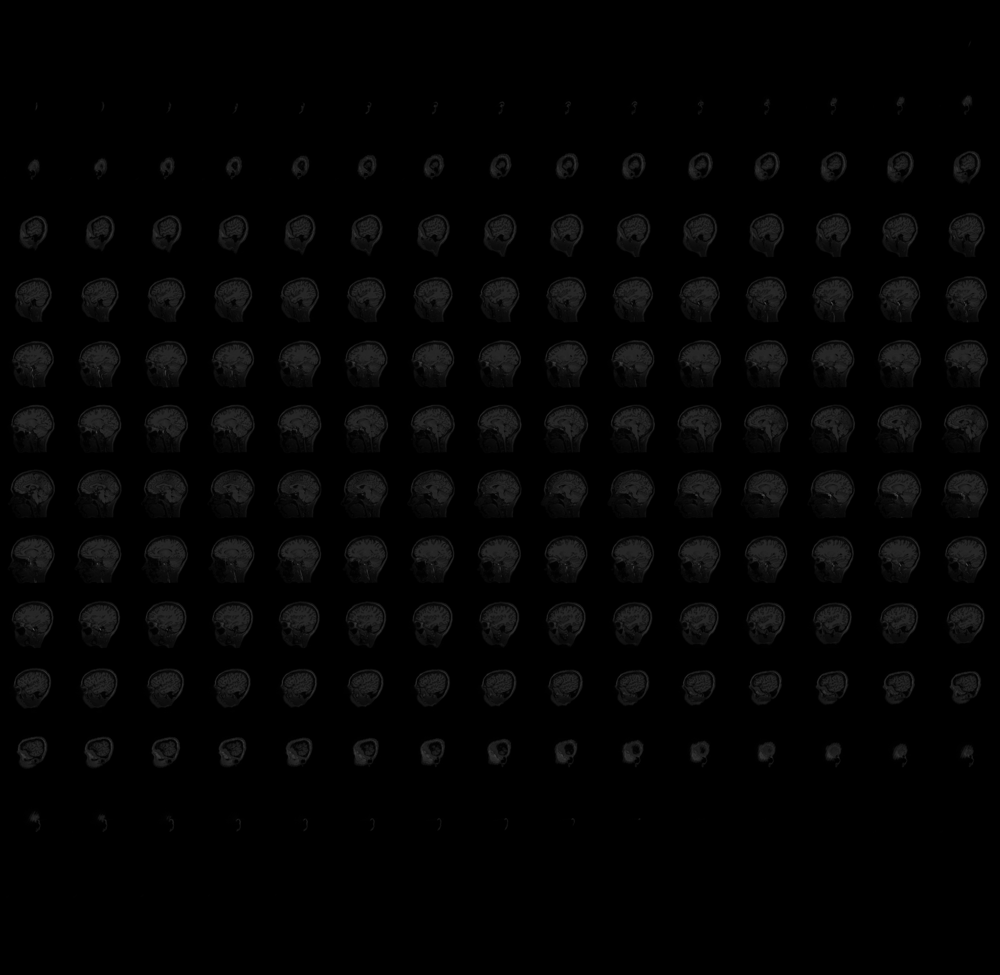
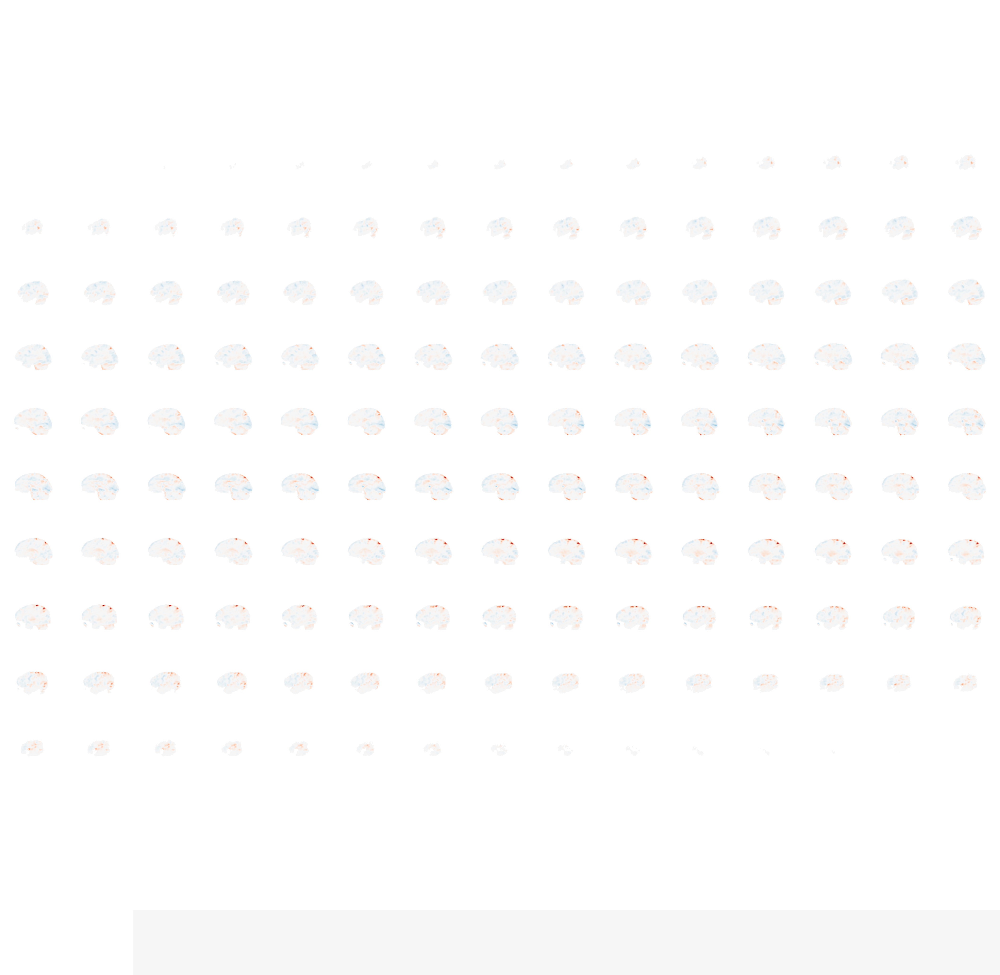

In [3]:
# =========================================
# Checking (visualize)
# =========================================

view = plotting.view_img(ants_to_nib(con_in_T1), bg_img=ants_to_nib(t1_native), opacity=0.6, symmetric_cmap=True)
view.width = 800
view.height = 500
view

In [4]:
# # -------------
# Inverse registration of mask (MNI -> native)
# register MNI T1 template to subject-specific T1 data
# # -------------
import matplotlib.pyplot as plt
from scipy.ndimage import binary_dilation, binary_erosion

# Settings
sub_id = 'sub-a203'
t1_path = DIR_T1FILES[next(i for i, p in enumerate(DIR_T1FILES) if p.match('**/'+ f"{sub_id}_*.nii"))]
# func_path = DIR_CFILES[next(i for i, p in enumerate(DIR_CFILES) if p.match('**/'+ f"{sub_id}_*.nii"))]
mni_to_t1 = (str(DIR_WARPFILES[next(i for i, p in enumerate(DIR_WARPFILES) if p.match('**/'+ f"{sub_id}_*.h5"))]))

# Load data
mask_paths = [p for p in DIR_MASK_OUT.rglob("*.nii.gz") if p.is_file()]
mask_paths = mask_paths + [p for p in DIR_MASK_TMP.rglob("*.nii.gz") if p.is_file()]
t1_native = ants.image_read(str(t1_path))  
t1_nib = nib.load(str(t1_path))
t1_arr = np.asarray(t1_nib.dataobj)
output_dir = t1_path.parent / "z_TMSTargets"
output_dir.mkdir(exist_ok=True)
vmin, vmax = np.percentile(t1_arr, (2, 98))  # for display

# Transform masks into native T1 space
for p in mask_paths:
    mov = ants.image_read(str(p))

    # Transform
    out = ants.apply_transforms(
        fixed=t1_native, 
        moving=mov,
        transformlist=[mni_to_t1],
        interpolator="nearestNeighbor"  # 'linear' if continuous map
    )

    # Export
    out_path = output_dir/ f"{sub_id}_{Path(p).stem}_inT1w.nii.gz"
    nib.save(out, str(out_path))

    # Save quick 3-view overlay PNG
    m = out.numpy() > 0
    nz = np.argwhere(m)
    i, j, k = (nz.mean(0).astype(int) if nz.size else np.array(m.shape) // 2)
    #if m.any() not true:i, j, k = (s // 2 for s in m.shape)

    # Quci draw an outline so T1 stays visible 
    edge = binary_dilation(m, iterations=1) ^ binary_erosion(m, iterations=1)
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    overlay_alpha = 0.35  # transparency of the red fill

    # --- sagittal ---
    axes[0].imshow(t1_arr[i, :, :].T, origin="lower", cmap="gray", vmin=vmin, vmax=vmax)
    fill_sag = np.ma.masked_where(~m[i, :, :].T, m[i, :, :].T)  # mask zeros
    axes[0].imshow(fill_sag, origin="lower", cmap="Reds", alpha=overlay_alpha, vmin=0, vmax=1, interpolation="none")
    axes[0].set_title(f"Sag i={i}"); axes[0].axis("off")

    # --- coronal ---
    axes[1].imshow(t1_arr[:, j, :].T, origin="lower", cmap="gray", vmin=vmin, vmax=vmax)
    fill_cor = np.ma.masked_where(~m[:, j, :].T, m[:, j, :].T)
    axes[1].imshow(fill_cor, origin="lower", cmap="Reds", alpha=overlay_alpha, vmin=0, vmax=1, interpolation="none")
    axes[1].set_title(f"Cor j={j}"); axes[1].axis("off")

    # --- axial ---
    axes[2].imshow(t1_arr[:, :, k].T, origin="lower", cmap="gray", vmin=vmin, vmax=vmax)
    fill_axi = np.ma.masked_where(~m[:, :, k].T, m[:, :, k].T)
    axes[2].imshow(fill_axi, origin="lower", cmap="Reds", alpha=overlay_alpha, vmin=0, vmax=1, interpolation="none")
    axes[2].set_title(f"Ax k={k}"); axes[2].axis("off")

    fig.suptitle(f"{sub_id}_{Path(p).stem}_inT1w", fontsize=11)
    png_path = output_dir / f"{sub_id}_{Path(p).stem}_inT1w_QC.png"
    plt.tight_layout()
    fig.savefig(str(png_path), dpi=200)
    plt.close(fig)


In [ ]:
# # METHOD without fmriprep

# # # -------------
# # Inverse registration of mask (MNI -> native)
# # register MNI T1 template to subject-specific T1 data
# # save transformation and apply to LC map
# # -in ANTs, fwdtransforms actually maps moving → fixed 
# # # -------------

# # Setting
# sub_id = 'sub-a200'

# # Load subjects' T1 data 
# t1_idx = next(i for i, p in enumerate(DIR_T1FILES) if p.match('**/'+ f"{sub_id}_*.nii"))
# t1_native = ants.image_read(str(DIR_T1FILES[t1_idx]))

# # Load specific mask
# mask_file = 'V1_Juelich'
# files_out = [p for p in DIR_MASK_OUT.rglob("*.nii.gz") if p.is_file()]
# files_tmp = [p for p in DIR_MASK_TMP.rglob("*.nii.gz") if p.is_file()]
# DIR_MASKAVAIL = list(dict.fromkeys(chain(files_out, files_tmp)))
# DIR_REF = DIR_MASK_TMP if ("neurosynth" in mask_file.lower()) else DIR_MASK_OUT
# mask_mni = ants.image_read(str(DIR_REF / f"{mask_file}_mask_MNI.nii.gz"))

# # Load functional mask to constrain
# func_idx = next(i for i, p in enumerate(DIR_T1FILES) if p.match('**/'+ f"{sub_id}_*.nii"))
# func_native = ants.image_read(str(DIR_CFILES[func_idx]))

# # Load mask
# target_label = 'xxx'
# if mask_file == "NeuroSynth" DIR_REF = DIR_MASK_TMP, else DIR_REF = DIR_MASK_OUT
# # mask_file = [p.name for p in  DIR_T1FILES]
# mask_mni = ants.image_read(str(DIR_REF / f"{target_label}_mask_MNI.nii.gz"))

# # Reorient subject native T1 to RAS (for registration)
# # always use original T1 data for neuronavigation
# t1_native_ras = ants.reorient_image2(t1_native, orientation='RAS')

# # Histogram-match MNI template to native T1
# t1_mni_hm = ants.histogram_match_image(
#     source_image=t1_mni,
#     reference_image=t1_native_ras,
#     number_of_histogram_bins=256,
#     number_of_match_points=128, 
#     use_threshold_at_mean_intensity=True  
#     )

# # Register MNI T1 → subject native T1
# reg_sub_mni = ants.registration(
#     fixed=t1_native_ras, 
#     moving=t1_mni_hm, 
#     type_of_transform='SyN')


# # Warp the mask into native space (but in RAS oriented)
# mask_native_ras = ants.apply_transforms(
#     fixed=t1_native_ras, 
#     moving=mask_mni, 
#     transformlist=reg_sub_mni['fwdtransforms'],  # use forward transform
#     interpolator='nearestNeighbor'  # for binary or probabilistic mask
# )

# # Confine masks to be within brains 
# brain_mask_native = ants.get_mask(t1_native_ras)
# mask_native_ras = mask_native_ras * brain_mask_native

# # Resample warped mask to match original T1 orientation
# mask_native = ants.resample_image_to_target(mask_native_ras, t1_native)

# # Output
# filename = f"{sub_id}_{target_label}_mask_MNI.nii.gz"
# filename = filename.replace("_MNI", "_native")
# ants.image_write(mask_native, str(DIR_T1FILES[sub_idx].parent / filename))

In [ ]:
# # -------------
# Prepare summarized outputs for TUS 
# - separate left/right hemisphere
# - apply weighting if functional data exis
# - constrain activation in gray matter
# - do snapping?
# # -------------

# Settings 
sub_id = 'sub-a203'
# target_label = 'prePMD'
THRESH_MASK   = 0.0     # binarize ROI if probabilistic
GM_THR        = 0.20    # GM prob threshold
USE_FUNC      = None # FUNC_NATIVE_PATH is not None
FUNC_TAIL     = "abs"   # "pos" | "neg" | "abs"
FUNC_QUANT    = 0.50    # keep top X% by functional score inside ROI
MIN_VOX       = 5       # fallback if selection too small
POINT_METHOD  = "wCOM"  # "wCOM" (weighted COM) or "peak"
CROWN_RADIUS  = 8.0     # mm neighborhood on pial when choosing gyral crown

# Brainsight header
brainsight_header = [
    "# Version: 13",
    "# Coordinate system: NIfTI:Scanner",
    "# Created by: Brainsight 2.5.1",
    "# Units: millimetres, degrees, milliseconds, and microvolts",
    "# Encoding: UTF-8",
    "# Notes: Each column is delimited by a tab. Each value within a column is delimited by a semicolon.",
    "# Target Name\tLoc. X\tLoc. Y\tLoc. Z\tm0n0\tm0n1\tm0n2\tm1n0\tm1n1\tm1n2\tm2n0\tm2n1\tm2n2"
]

# File paths
t1_path = DIR_T1FILES[next(i for i, p in enumerate(DIR_T1FILES) if p.match('**/'+ f"{sub_id}_*.nii"))]
mni_to_t1 = (str(DIR_WARPFILES[next(i for i, p in enumerate(DIR_WARPFILES) if p.match('**/'+ f"{sub_id}_*.h5"))]))
bmask_path = DIR_T1BMASK[next(i for i, p in enumerate(DIR_T1BMASK) if p.match('**/'+ f"{sub_id}_*.nii.gz"))]
gm_path = DIR_T1GM[next(i for i, p in enumerate(DIR_T1GM) if p.match('**/'+ f"{sub_id}_*.nii.gz"))]

# File path (all masks)
sub_dir     =  Path(t1_path).parent 
roi_dir     = sub_dir/ "z_TMSTargets"
# roi_paths   = [p for p in roi_dir.rglob("*.nii.gz") if target_label in p.name]
roi_paths = sorted([p for p in roi_dir.rglob("*.nii.gz")])  # all masks at once
if USE_FUNC is not None:func_path   = [p for p in sub_dir.rglob("*_con_0001_native.nii.gz")][0]
if USE_FUNC is None:print("Functional data is missing, so relevant steps will be skipped")

# Load T1 data & define properties
t1_native = ants.image_read(str(t1_path))
t1_nib    = nib.load(str(t1_path))
affine    = t1_nib.affine
direction = np.array(t1_native.direction)
spacing   = np.array(t1_native.spacing)
origin    = np.array(t1_native.origin)

# Load gray matter mask and functional data
bmask_np = (nib.load(str(bmask_path)).get_fdata() > 0.5)
gm_np = nib.load(str(gm_path)).get_fdata()
if USE_FUNC is not None:
    func_img  = nib.load(str(func_path))
    func_data = np.asarray(func_img.dataobj)
    func_ok_global = (func_img.shape == t1_nib.shape) and np.allclose(func_img.affine, affine, atol=1e-3)

# Midline: compute once from brain-mask extent (world X) ===
bm_i, bm_j, bm_k = np.nonzero(bmask_np)
bm_x = nib.affines.apply_affine(affine, np.c_[bm_i, bm_j, bm_k])[:, 0]
midline_x = 0.5 * (bm_x.min() + bm_x.max())
eps = 1e-6  # tolerance for ties on the plane

# -------- Main loop over ROI files --------
rows = []
rows_bs = []

for mp in roi_paths:
    roi_img = nib.load(str(mp))
    roi_np  = (np.asarray(roi_img.dataobj) > THRESH_MASK)

    # 1) Constrain by brain & GM
    m0 = roi_np & bmask_np & (gm_np >= GM_THR)

    # 2) Functional focusing only if grid matches T1 exactly
    if USE_FUNC is not None and func_ok_global:m0 = threshold_epi(m0, func_data, tail=FUNC_TAIL, q=FUNC_QUANT, min_vox=MIN_VOX)

    # 3) Light clean + keep largest component
    m0 = binary_fill_holes(m0)
    m0 = binary_closing(m0, iterations=1)
    #m0 = detect_cluster(m0)

    # 4) Split into hemispheres using midline from T1 geometry
    ii, jj, kk = np.nonzero(m0) 
    ijk = np.c_[ii, jj, kk]
    xw  = nib.affines.apply_affine(affine, ijk)[:, 0]

    left_sel  = xw <= (midline_x + eps)
    right_sel = xw  >  (midline_x + eps)

    print("L vox:", int(left_sel.sum()), "R vox:", int(right_sel.sum()))

    # 5) Compute weighted center of mass
    weight_vol = None
    if USE_FUNC is not None:
        if   FUNC_TAIL == "pos": weight_vol = np.maximum(func_data, 0)
        if   FUNC_TAIL == "neg": weight_vol = np.maximum(-func_data, 0)
        if   FUNC_TAIL == "abs": weight_vol = np.abs(func_data)

    xyzL = wcom_from_sel(ii, jj, kk, left_sel,  affine, weight_vol)
    xyzR = wcom_from_sel(ii, jj, kk, right_sel, affine, weight_vol)
    print("xyzL:", xyzL, "xyzR:", xyzR)

    # 6) Output summary table  —— use xyzL/xyzR directly
    m_orient = affine[:3, :3]
    voxel_vol_mm3 = float(np.abs(np.linalg.det(affine[:3, :3])))
    label_base = Path(mp).name.removesuffix(".nii.gz").removesuffix(".nii").removeprefix(f"{sub_id}_").removesuffix("_inT1w").split("_mask", 1)[0]


    for hemi_label, hemi_sel, xyz in (("L", left_sel, xyzL), ("R", right_sel, xyzR)):
        # QC stats
        n_vox   = int(ii[hemi_sel].size)
        if (n_vox == 0) or (xyz is None):continue  
        vol_mm3 = n_vox * voxel_vol_mm3

        # optional functional summaries inside the hemi selection
        if (weight_vol is not None) and (n_vox > 0):
            wvals  = weight_vol[ii[hemi_sel], jj[hemi_sel], kk[hemi_sel]]
            wvals  = np.nan_to_num(wvals, nan=0.0)
            w_sum  = float(wvals.sum())
            w_mean = float(wvals.mean()) if wvals.size else float("nan")
            w_max  = float(wvals.max())  if wvals.size else float("nan")
        else:
            w_sum = w_mean = w_max = None

        # Summary
        rows.append({
            'subject_id': sub_id,
            'hemisphere': hemi_label,
            'mask_used': mp.name,
            'target_label': label_base,
            'x': float(xyz[0]),
            'y': float(xyz[1]),
            'z': float(xyz[2]),
            'count': n_vox,
            'volume_mm3': vol_mm3,
            'weight_sum': w_sum,
            'weight_mean': w_mean,
            'weight_max': w_max,
            't1_path': str(t1_path),
            "m0n0": m_orient[0,0], "m0n1": m_orient[0,1], "m0n2": m_orient[0,2],
            "m1n0": m_orient[1,0], "m1n1": m_orient[1,1], "m1n2": m_orient[1,2],
            "m2n0": m_orient[2,0], "m2n1": m_orient[2,1], "m2n2": m_orient[2,2]
        })

        # Neuronavigation 
        # m_flipped = np.diag([-1, -1, 1]) @ m_orient  # RAS -> LAS
        U, _, Vt = np.linalg.svd(m_orient)
        m_nav = U @ Vt
        rows_bs.append({
            "Target Name": f"{label_base}_{hemi_label}_Target",
            "Loc. X": round(float(xyz[0]), 4),  # ← 反転しない
            "Loc. Y": round(float(xyz[1]), 4),  # ← 反転しない
            "Loc. Z": round(float(xyz[2]), 4),  # ← 反転しない
            "m0n0": round(m_nav[0,0], 6), "m0n1": round(m_nav[0,1], 6), "m0n2": round(m_nav[0,2], 6),
            "m1n0": round(m_nav[1,0], 6), "m1n1": round(m_nav[1,1], 6), "m1n2": round(m_nav[1,2], 6),
            "m2n0": round(m_nav[2,0], 6), "m2n1": round(m_nav[2,1], 6), "m2n2": round(m_nav[2,2], 6),
        })

import pandas as pd
csv_path = roi_dir / f"{sub_id}_TMS_target_coordinates.csv"
pd.DataFrame(rows).to_csv(csv_path, index=False)
print(pd.DataFrame(rows))

bs_path = roi_dir / f"{sub_id}_TMS_target_coordinates_Brainsight.txt" 
bs_path.write_text("\n".join(brainsight_header) + "\n" +pd.DataFrame(rows_bs).to_csv(sep="\t", index=False, header=False),encoding="utf-8")



Functional data is missing, so relevant steps will be skipped
L vox: 2298 R vox: 1152
xyzL: [-45.61597887  34.87721286  -3.93425668] xyzR: [43.18009211 38.57006581 -3.25895642]
L vox: 3564 R vox: 3030
xyzL: [-33.71309164 -24.66932362   1.12303143] xyzR: [ 35.54659691 -21.78763785   6.28408824]
L vox: 10936 R vox: 12508
xyzL: [ -5.38271605 -51.1715922  -29.35091632] xyzR: [ 12.5912946  -50.47580528 -30.70975153]
L vox: 2104 R vox: 719
xyzL: [-5.48696747  4.84609425 27.21960364] xyzR: [ 4.33956448  4.98382144 26.58839676]
L vox: 2074 R vox: 2065
xyzL: [-38.66752375  27.99453449  -0.96690596] xyzR: [32.64740077 28.31364371  3.53698708]
L vox: 0 R vox: 0
xyzL: None xyzR: None
  subject_id hemisphere                                          mask_used  \
0   sub-a203          L  sub-a203_DLPFC_Schaefer_mask_MNI.nii_inT1w.nii.gz   
1   sub-a203          R  sub-a203_DLPFC_Schaefer_mask_MNI.nii_inT1w.nii.gz   
2   sub-a203          L     sub-a203_IPS_Juelich_mask_MNI.nii_inT1w.nii.gz   
3   sub

1642

In [ ]:

# =====================
# OLD STUFF
# =====================


3346

In [ ]:
n_roi            = int(roi_np.sum())
n_after_brain    = int((roi_np & bmask_np).sum())
n_after_gm       = int((roi_np & bmask_np & (gm_np >= GM_THR)).sum())
n_after_func     = int(m0.sum())   # ここまでが現時点の m0
print(f"[{mp.name}] roi:{n_roi}  ∩brain:{n_after_brain}  ∩GM:{n_after_gm}  after_func:{n_after_func}")


[sub-a200_prePMD_Juelich_mask_MNI.nii_inT1w.nii.gz] roi:0  ∩brain:0  ∩GM:0  after_func:0


In [ ]:
sub-M3902_aMCC_NeuroSynthTopic112_mask_native
M3902_aMCC_mask_natNeuroSynthTopic112ive

In [ ]:
import numpy as np
import ants
import nibabel as nib
from nilearn import plotting
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# --- Load all segmentation maps ---
sub_idx = 3
c1 = ants.image_read(str(DIR_T1C1FILES[sub_idx]))  # GM
c2 = ants.image_read(str(DIR_T1C2FILES[sub_idx]))  # WM
c3 = ants.image_read(str(DIR_T1C3FILES[sub_idx]))  # CSF
c4 = ants.image_read(str(DIR_T1C4FILES[sub_idx]))  # Skull
c5 = ants.image_read(str(DIR_T1C5FILES[sub_idx]))  # Scalp
c6 = ants.image_read(str(DIR_T1C6FILES[sub_idx]))  # Background

# --- Dilate c5 (scalp) to fill possible gaps ---
c5_dilated = ants.morphology(c5, operation='dilate', radius=4)

# --- Combine tissues (c1-c5), then subtract background ---
combined = (
    c1.numpy() +
    c2.numpy() +
    c3.numpy() +
    c4.numpy() +
    c5_dilated.numpy()
)

# --- Subtract background (c6) ---
c6_bin = (c6.numpy() > 0.99).astype(np.uint8)
combined_cleaned = combined * (1 - c6_bin)  # zero out background voxels

# --- Smooth and threshold ---
smoothed = gaussian_filter(combined_cleaned, sigma=1)
mask_np = (smoothed > 0.1).astype(np.uint8)

# --- Convert to NIfTI for viewing ---
spacing = np.array(c1.spacing)
origin = np.array(c1.origin)
direction = np.array(c1.direction)

affine = np.eye(4)
affine[:3, :3] = direction * spacing
affine[:3, 3] = origin

mask_nib = nib.Nifti1Image(mask_np, affine)

# --- Load T1 for background ---
t1_native = ants.image_read(str(DIR_T1FILES[sub_idx]))
t1_nib = nib.Nifti1Image(t1_native.numpy(), affine)

# --- Visualize interactively ---
plotting.view_img(
    mask_nib,
    bg_img=t1_nib,
    cmap="Oranges",
    opacity=0.5,
    title="Tissue Mask (c1–c5) minus Background (c6)"
).open_in_browser()

/Users/atsushikikumoto/opt/anaconda3/envs/mri/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning:


/var/folders/st/vdmcwrln1mb0m0p2cbhwfhvc0000gn/T/ipykernel_23088/3957775592.py:53: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.



In [ ]:

# Get affine from c5 (assume original direction/spacing/origin is correct)
spacing = np.array(c5.spacing)
origin = np.array(c5.origin)
direction = np.array(c5.direction)

affine = np.eye(4)
affine[:3, :3] = direction * spacing
affine[:3, 3] = origin

# Convert to Nifti image
c5_clean_nib = nib.Nifti1Image(c5_dilated.numpy(), affine=affine)

# Load T1 image for background
t1_nib = nib.Nifti1Image(t1_native.numpy(), affine=affine)

# Visualize
plotting.view_img(
    c5_clean_nib,
    bg_img=t1_nib,
    cmap='YlOrBr',
    opacity=0.5,
    title='Cleaned c5 Mask (Soft Tissue)'
).open_in_browser()

/Users/atsushikikumoto/opt/anaconda3/envs/mri/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning:




In [ ]:
# # -------------
# # Saving .mat as .nii/.nii.gz
# # -------------


# # 1. Load the .mat file
# mat = scipy.io.loadmat('your_file.mat')

# # 2. Extract the 3D data array
# # Replace 'your_varname' with the actual variable name in the .mat file
# data = mat['your_varname']  # e.g., data.shape == (x, y, z)

# # 3. Define affine (identity or use a real one if you have it)
# affine = np.eye(4)

# # 4. Create NIfTI image
# nii = nib.Nifti1Image(data.astype(np.float32), affine)

# # 5. Save the NIfTI file
# nib.save(nii, 'output.nii.gz')